### FEMA Building Footprints - Exploratory Data Analysis

Authors: Kaiwen Dong

This notebook investigates the feasibility of identifying highly-occupied apartments—here, operationalized as having 90 or more rooms—in any U.S. city given building footprint data. We use the **[USA Structures dataset](https://gis-fema.hub.arcgis.com/pages/usa-structures)** from FEMA (Federal Emergency Management Agency, Department of Homeland Security) to analyze the square footage of buildings that have been segmented from aerial photography using computer vision. We then examine correlations between these estimated areas, buildings sourced from the Rentcast API, and foot traffic points from Safegraph.


#### Imports


In [1]:
%load_ext autoreload
%autoreload 2

# Third-party imports
import fiona
import folium
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from IPython.display import display, HTML

# Application imports
from utils.constants import DATA_DIR
from utils.fema import (
    buffer_geometry,
    calculate_units, 
    draw_building_size_plot,
    preview_dataset
)

#### 1. Data Characteristics

There are 374,703 records within the Hawaiian building footprints dataset. Relevant columns include the primary key (`BUILD_ID`), building occupancy class (`OCC_CLS`), primary building occupancy class (`PRIM_OCC`), building height in meters (`HEIGHT`), and building area in square feet (`SQFEET`) and square meters (`SQMETERS`).


In [2]:
# Load data
fpath = f"{DATA_DIR}/building-footprints/HI_Structures.gdb"
layers = fiona.listlayers(fpath)
footprints_gdf = gpd.read_file(fpath, layer=layers[0])

# Preview data
preview_dataset(footprints_gdf)

'374,703 record(s) and 29 column(s)'

Index(['BUILD_ID', 'OCC_CLS', 'PRIM_OCC', 'SEC_OCC', 'PROP_ADDR', 'PROP_CITY',
       'PROP_ST', 'PROP_ZIP', 'OUTBLDG', 'HEIGHT', 'SQMETERS', 'SQFEET',
       'H_ADJ_ELEV', 'L_ADJ_ELEV', 'FIPS', 'CENSUSCODE', 'PROD_DATE', 'SOURCE',
       'USNG', 'LONGITUDE', 'LATITUDE', 'IMAGE_NAME', 'IMAGE_DATE',
       'VAL_METHOD', 'REMARKS', 'UUID', 'Shape_Length', 'Shape_Area',
       'geometry'],
      dtype='object')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374703 entries, 0 to 374702
Data columns (total 6 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   BUILD_ID  374703 non-null  int64  
 1   OCC_CLS   374703 non-null  object 
 2   PRIM_OCC  374703 non-null  object 
 3   HEIGHT    160128 non-null  float64
 4   SQFEET    374703 non-null  float64
 5   SQMETERS  374703 non-null  float64
dtypes: float64(3), int64(1), object(2)
memory usage: 17.2+ MB


None

,HEIGHT,SQFEET,SQMETERS
count,160128.000000,3.747030e+05,374703.000000
mean,4.469020,3.140938e+03,291.802973
std,2.502125,7.715820e+03,716.823785
min,0.020000,4.500058e+02,41.806946
25%,3.300000,1.483758e+03,137.845749
50%,4.040000,2.298148e+03,213.505112
75%,5.210000,3.290723e+03,305.718491
max,103.669998,2.275567e+06,211407.312500


,BUILD_ID,OCC_CLS,PRIM_OCC,HEIGHT,SQFEET,SQMETERS
0,915439,Unclassified,Unclassified,NaN,2169.510010,201.554260
1,915448,Unclassified,Unclassified,NaN,486.964630,45.240540
2,915468,Unclassified,Unclassified,NaN,691.395630,64.232819
3,918374,Unclassified,Unclassified,NaN,830.360229,77.143066
4,918382,Unclassified,Unclassified,NaN,1893.865845,175.946060


Of these records, 17,241 are located within the census designated place Hilo. Notably, Hilo doesn't have any recorded building heights, so we can only use area.


In [3]:
# Subset to Hilo only
hilo_boundary = gpd.read_file(f"{DATA_DIR}/hilo_fixed.geojson")
footprints_gdf = footprints_gdf[
    footprints_gdf.intersects(hilo_boundary.iloc[0]["geometry"])
]
preview_dataset(footprints_gdf)

'17,241 record(s) and 29 column(s)'

Index(['BUILD_ID', 'OCC_CLS', 'PRIM_OCC', 'SEC_OCC', 'PROP_ADDR', 'PROP_CITY',
       'PROP_ST', 'PROP_ZIP', 'OUTBLDG', 'HEIGHT', 'SQMETERS', 'SQFEET',
       'H_ADJ_ELEV', 'L_ADJ_ELEV', 'FIPS', 'CENSUSCODE', 'PROD_DATE', 'SOURCE',
       'USNG', 'LONGITUDE', 'LATITUDE', 'IMAGE_NAME', 'IMAGE_DATE',
       'VAL_METHOD', 'REMARKS', 'UUID', 'Shape_Length', 'Shape_Area',
       'geometry'],
      dtype='object')

<class 'pandas.core.frame.DataFrame'>
Index: 17241 entries, 164061 to 182056
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   BUILD_ID  17241 non-null  int64  
 1   OCC_CLS   17241 non-null  object 
 2   PRIM_OCC  17241 non-null  object 
 3   HEIGHT    0 non-null      float64
 4   SQFEET    17241 non-null  float64
 5   SQMETERS  17241 non-null  float64
dtypes: float64(3), int64(1), object(2)
memory usage: 942.9+ KB


None

,HEIGHT,SQFEET,SQMETERS
count,0.0,17241.000000,17241.000000
mean,NaN,3715.362180,345.168775
std,NaN,5975.314155,555.125389
min,NaN,450.252350,41.829853
25%,NaN,2027.174683,188.330872
50%,NaN,2964.627686,275.423187
75%,NaN,3987.331299,370.435547
max,NaN,377693.812500,35088.937500


,BUILD_ID,OCC_CLS,PRIM_OCC,HEIGHT,SQFEET,SQMETERS
164061,142869,Residential,Single Family Dwelling,NaN,2582.567871,239.928635
164071,142962,Residential,Single Family Dwelling,NaN,3488.075439,324.053131
164085,143148,Residential,Single Family Dwelling,NaN,6038.880859,561.030945
164086,143157,Residential,Single Family Dwelling,NaN,3742.460449,347.686279
164099,143350,Residential,Single Family Dwelling,NaN,1978.324829,183.792572


The vast majority of the building footprints in Hilo are classified as single family dwellings (~87 percent). Other residential types include multi-family dwellings (~2 percent); temporary lodging (~0.001 percent); institutional dormitories, or prisons (~0.0006 percent); and nursing homes (~0.0005 percent). Nursing homes have a median square footage of 20,185, the highest of all types. By contrast, single- and multi-family dwellings have median areas of 2,954 and 4,681 square feet, respectively, but many more outliers—up to around 50,000 square feet.


In [4]:
# Examine distribution of residential classification types
residential_occ = [
    "Single Family Dwelling",
    "Mobile Home",
    "Multi - Family Dwelling",
    "Temporary Lodging",
    "Institutional Dormitory",
    "Nursing Home",
]
temp = footprints_gdf.query("PRIM_OCC in @residential_occ")[["PRIM_OCC"]].copy()
temp["COUNT"] = 1
temp.groupby("PRIM_OCC").sum().reset_index().sort_values(
    by="COUNT", ascending=False
).reset_index(drop=True)

,PRIM_OCC,COUNT
0,Single Family Dwelling,14954
1,Multi - Family Dwelling,329
2,Temporary Lodging,22
3,Institutional Dormitory,10
4,Nursing Home,8


SQFEET                                          \
                           count          mean           std         min   
PRIM_OCC                                                                   
Institutional Dormitory     10.0   7977.319116   8002.766835  468.699768   
Multi - Family Dwelling    329.0   6079.858678   6353.184403  455.316711   
Nursing Home                 8.0  31398.633118  32576.542149  882.166260   
Single Family Dwelling   14954.0   3132.289831   1878.213435  450.252350   
Temporary Lodging           22.0   9671.840848  13970.114036  450.276123   

                                                                                
                                 25%           50%           75%           max  
PRIM_OCC                                                                        
Institutional Dormitory  1522.009583   6023.592529  12602.900391  25427.939453  
Multi - Family Dwelling  2218.004395   4681.045898   6809.693359  49377.960938  
Nursing Home             1218.576843  20185.586914  64398.977539  76618.687500  
Single Family Dwelling   2116.827332   2954.433716   3822.871094  50692.343750  
Temporary Lodging         891.704453   4508.551270  10211.035400  55945.066406

/tmp/ipykernel_4455/3527741554.py:9: UserWarning: When passing multiple axes, sharex and sharey are ignored. These settings must be specified when creating axes.
  grouped.boxplot(ax=ax.flatten()[:5], sharex=True, sharey=True)
/tmp/ipykernel_4455/3527741554.py:11: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


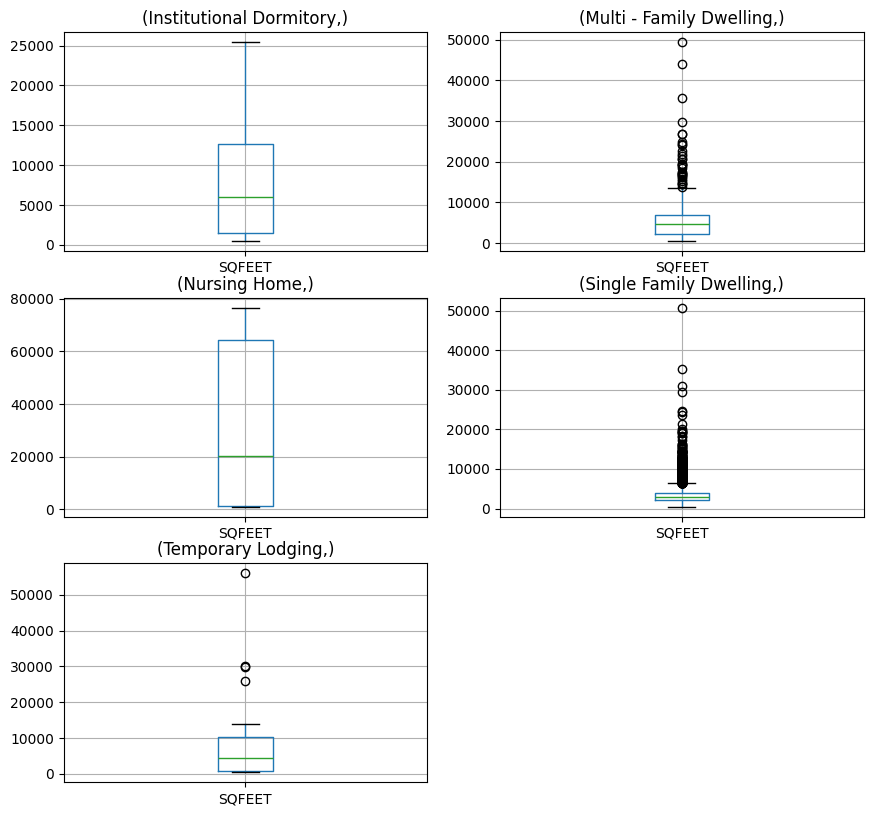

In [5]:
fig, ax = plt.subplots(3, 2, figsize=(10, 10))
fig.tight_layout(pad=2)
grouped = (
    footprints_gdf.query("PRIM_OCC in @residential_occ")
    .loc[:, ["PRIM_OCC", "SQFEET"]]
    .groupby(by=["PRIM_OCC"])
)
display(grouped.describe())
grouped.boxplot(ax=ax.flatten()[:5], sharex=True, sharey=True)
fig.delaxes(ax[2, 1])
fig.show()

#### 2. Comparison with Rentcast Property Records

{Your commentary here}


In [6]:
# Load Rentcast apartment data
rentcast_apts_df = pd.read_json(f"{DATA_DIR}/rentcast/hilo/Hilo_apartment.json")
rentcast_apts_gdf = gpd.GeoDataFrame(
    rentcast_apts_df,
    geometry=gpd.points_from_xy(
        x=rentcast_apts_df["longitude"], y=rentcast_apts_df["latitude"]
    ),
    crs="EPSG:4326",
)

# Join apartments to footprints on a spatial intersection
joined_apts_gdf = gpd.sjoin(
    rentcast_apts_gdf, footprints_gdf, how="inner", op="intersects"
)

# Examine correlation of square footage measurements across datasets
joined_apts_gdf[["squareFootage", "SQFEET"]].corr()

/home/launagreer/clinic/2024-winter-perpetual/env/lib/python3.11/site-packages/IPython/core/interactiveshell.py:3517: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


,squareFootage,SQFEET
squareFootage,1.000000,-0.453416
SQFEET,-0.453416,1.000000


In [7]:
# Join **all** Rentcast buildings to footprints to assess larger correlations
rentcast_all_df = pd.read_json(f"{DATA_DIR}/rentcast/hilo/Hilo_all.json")
rentcast_all_gdf = gpd.GeoDataFrame(
    rentcast_all_df,
    geometry=gpd.points_from_xy(
        x=rentcast_all_df["longitude"], y=rentcast_all_df["latitude"]
    ),
    crs="EPSG:4326",
)
joined_all_gdf = gpd.sjoin(
    rentcast_all_gdf, footprints_gdf, how="inner", op="intersects"
)
joined_all_gdf[["squareFootage", "SQFEET"]].corr()

/home/launagreer/clinic/2024-winter-perpetual/env/lib/python3.11/site-packages/IPython/core/interactiveshell.py:3517: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


,squareFootage,SQFEET
squareFootage,1.000000,-0.133902
SQFEET,-0.133902,1.000000


In [8]:
# Initialize map
tileset_url = "https://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png"
attr = '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors &copy; <a href="https://carto.com/attributions">CARTO</a>'
tiles = folium.TileLayer(tileset_url, name="CartoDB (Basemap)", attr=attr)
fmap = footprints_gdf[["PRIM_OCC", "SQFEET", "geometry"]].explore(
    column="PRIM_OCC", tiles=tiles, attr=attr, name="Building Footprints"
)
fmap = rentcast_apts_gdf[
    ["propertyType", "formattedAddress", "squareFootage", "geometry"]
].explore(m=fmap, name="Rentcast Apartments")
folium.LayerControl().add_to(fmap)
fmap

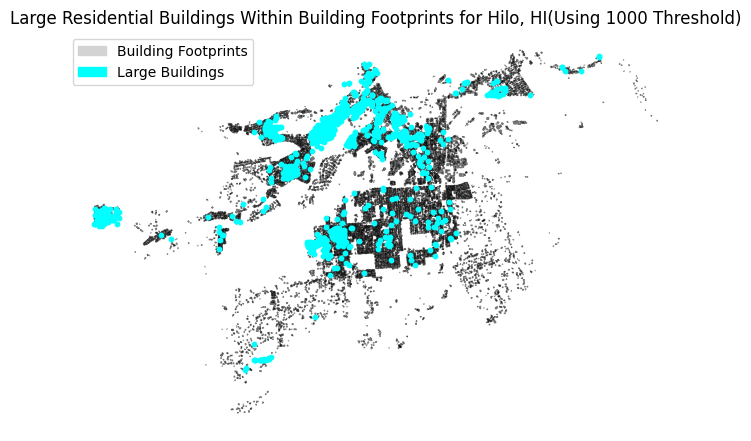

None

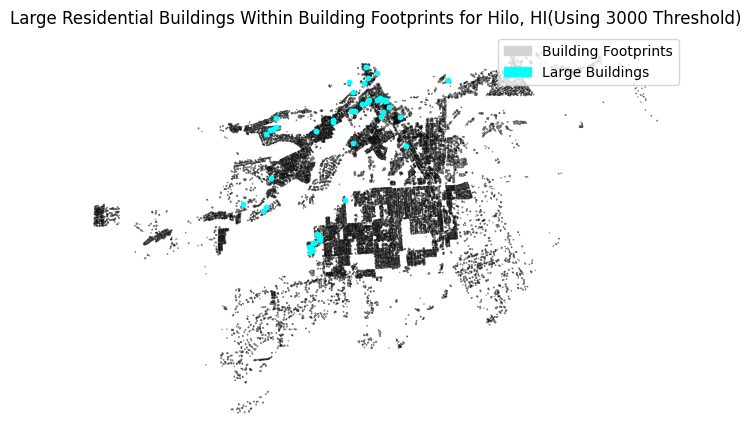

None

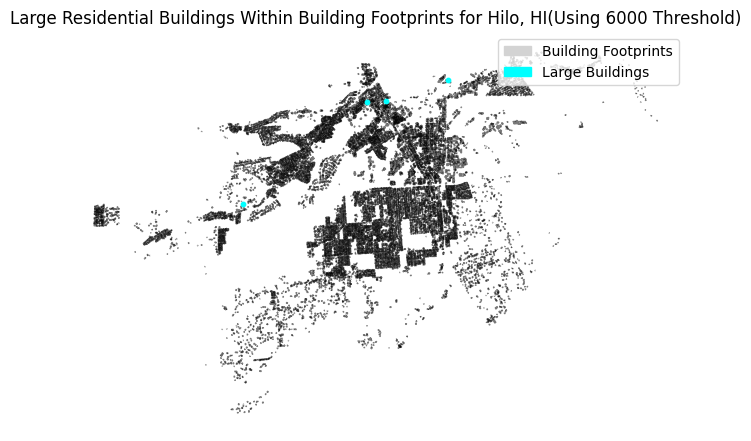

None

In [9]:
# Juxtapose different building sizes against all footprints
for threshold in (1000, 3000, 6000, 9000):
    draw_building_size_plot(
        footprints_gdf, joined_all_gdf, city_name="Hilo, HI", size_threshold=threshold
    )

#### 3. Comparision with Safegraph Foot Traffic Data


In [10]:
# Load foot traffic data and convert to GeoDataFrame
foot_traffic_df = pd.read_parquet(f"{DATA_DIR}/foot-traffic/hilo_full_patterns.parquet")
foot_traffic_gdf = gpd.GeoDataFrame(
    foot_traffic_df,
    geometry=gpd.points_from_xy(
        x=foot_traffic_df["longitude"], y=foot_traffic_df["latitude"]
    ),
    crs="EPSG:4326",
)

# Report number of records and preview first few rows
display(HTML("<b>Count</b>"))
display(len(foot_traffic_gdf))
foot_traffic_gdf.head(2)

47954

,placekey,safegraph_place_id,parent_placekey,parent_safegraph_place_id,location_name,safegraph_brand_ids,brands,top_category,sub_category,category_tags,...,median_dwell,bucketed_dwell_times,related_same_day_brand,related_same_month_brand,popularity_by_hour,popularity_by_day,device_type,poi_cbg,visitor_daytime_cbgs,geometry
2353,zzw-223@bp4-jct-t5f,sg:a6abadf575c64c7aa2957973c322c258,None,None,YMCA,SG_BRAND_8c40d09d7a855232f6ae8762ffd5966a,YMCA,Individual and Family Services,Other Individual and Family Services,None,...,NaN,None,None,None,None,None,None,NaN,None,POINT (-155.08010 19.70508)
3153,22d-222@bp4-jct-f75,sg:e170329441704027b328f7603705729f,228-222@bp4-jct-hkf,sg:d4f8d56cb61345e6b33a5a1382a503d7,Happy Valley Seafood Restaurant,None,None,Restaurants and Other Eating Places,Full-Service Restaurants,Chinese Food,...,14.0,"{""<5"":10,""5-10"":23,""11-20"":11,""21-60"":18,""61-1...",{},"{""CVS"":57,""Target"":49,""7-Eleven"":35,""Walmart"":...","[1,1,0,1,0,0,2,8,6,7,10,13,15,13,9,11,7,3,0,1,...","{""Monday"":13,""Tuesday"":9,""Wednesday"":11,""Thurs...","{""android"":21,""ios"":24}",1.500102e+11,"{""150010210131"":4,""150010207012"":4,""1500102050...",POINT (-155.07606 19.71020)


In [11]:
# Drop any records with missing or invalid geometries
import warnings

warnings.filterwarnings("ignore", "GeoSeries.notna", UserWarning)
filters = (
    (foot_traffic_gdf.geometry.is_valid)
    & (~foot_traffic_gdf.geometry.is_empty)
    & (foot_traffic_gdf.geometry.notna())
)
foot_traffic_gdf = foot_traffic_gdf[filters]
display(HTML("<b>Count</b>"))
display(len(foot_traffic_gdf))

45290

In [12]:
# Group foot traffic data by location and sum raw visit counts
grp_cols = ["safegraph_place_id", "location_name", "street_address", "geometry"]
count_cols = ["raw_visit_counts", "raw_visitor_counts"]
agg_foot_traffic_gdf = (
    foot_traffic_gdf[grp_cols + count_cols].groupby(grp_cols).sum().reset_index()
)
agg_foot_traffic_gdf = gpd.GeoDataFrame(agg_foot_traffic_gdf)
agg_foot_traffic_gdf.head(2)

,safegraph_place_id,location_name,street_address,geometry,raw_visit_counts,raw_visitor_counts
0,sg:003c91fcb4b94ac388c2591f3c2447e0,Blue Hawaii Antiques,271 Keawe St,POINT (-155.08641 19.72364),379.0,352.0
1,sg:003feb8df3804f93955c52b1b09a819f,King's Vietnamese Cuisine,57 Mamo St,POINT (-155.08503 19.72299),7844.0,5882.0


In [13]:
# Add unit count estimation to Rentcast building/building footprint intersections
joined_all_gdf["number_of_units"] = joined_all_gdf.apply(calculate_units, axis=1)

# Buffer  intersections
buffers_gdf = gpd.GeoDataFrame(
    joined_all_gdf, geometry=buffer_geometry(joined_all_gdf, radius_in_meters=10)
)
buffers_gdf = buffers_gdf[
    [
        "formattedAddress",
        "addressLine1",
        "number_of_units",
        "SQFEET",
        "SQMETERS",
        "geometry",
    ]
]
buffers_gdf.head(2)

,formattedAddress,addressLine1,number_of_units,SQFEET,SQMETERS,geometry
0,"189 Kukuau St, Unit 100, Hilo, HI 96720",189 Kukuau St,7.756353,4591.760742,426.588928,"POLYGON ((-155.08580 19.71834, -155.08580 19.7..."
16,"Kukuau Cottages 189 Kukuau St, Hilo, HI 96720",Kukuau Cottages 189 Kukuau St,7.756353,4591.760742,426.588928,"POLYGON ((-155.08587 19.71825, -155.08587 19.7..."


In [14]:
# Intersect with foot traffic
captured_traffic_gdf = gpd.sjoin(
    agg_foot_traffic_gdf, buffers_gdf, how="inner", op="within"
)
captured_traffic_gdf.head()

/home/launagreer/clinic/2024-winter-perpetual/env/lib/python3.11/site-packages/IPython/core/interactiveshell.py:3517: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


,safegraph_place_id,location_name,street_address,geometry,raw_visit_counts,raw_visitor_counts,index_right,formattedAddress,addressLine1,number_of_units,SQFEET,SQMETERS
19,sg:03404578685f43339a39ff6e2a39af46,Tattoo Valor,255 Keawe St,POINT (-155.08648 19.72386),0.0,0.0,70,"251 Keawe St, Hilo, HI 96720",251 Keawe St,12.699108,7517.872070,698.433838
136,sg:1aa6235cfab74962b8ba395681414a02,Brio Photo Booth Co,249 Keawe St,POINT (-155.08650 19.72390),0.0,0.0,70,"251 Keawe St, Hilo, HI 96720",251 Keawe St,12.699108,7517.872070,698.433838
158,sg:1fa04a99932b427885a3be079fc19e6c,Stella's Place,259 Keawe St,POINT (-155.08652 19.72382),1122.0,962.0,70,"251 Keawe St, Hilo, HI 96720",251 Keawe St,12.699108,7517.872070,698.433838
56,sg:0a6bfbc61ac04c8e8a6dfef0018efbc9,Takata Dental Health Center,445 Waianuenue Ave,POINT (-155.09267 19.72285),130.0,95.0,291,"445 Waianuenue Ave, Hilo, HI 96720",445 Waianuenue Ave,2.557165,5878.921875,546.170227
179,sg:233f23224d594e95818dd38f69f92903,Byun Paul H DDS,445 Waianuenue Ave,POINT (-155.09264 19.72285),11600.0,4533.0,291,"445 Waianuenue Ave, Hilo, HI 96720",445 Waianuenue Ave,2.557165,5878.921875,546.170227


In [15]:
# Group by Rentcast location
grp_cols = ["addressLine1", "number_of_units", "SQFEET"]
cols_to_analyze = [
    "raw_visit_counts",
    "raw_visitor_counts",
]
address_traffic_gdf = (
    captured_traffic_gdf[grp_cols + cols_to_analyze]
    .groupby(grp_cols)
    .sum()
    .reset_index()
)
address_traffic_gdf.head()

,addressLine1,number_of_units,SQFEET,raw_visit_counts,raw_visitor_counts
0,100 Pauahi St,10.185431,20370.861328,4201.0,2250.0
1,101 Aupuni St,74.522342,44117.226562,78930.0,41392.0
2,110 Ponahawai St,40.546327,24003.425781,0.0,0.0
3,121 Banyan Dr,11.563100,6845.355469,2499.0,1516.0
4,132 Kilauea Ave,1.278611,2939.527100,6.0,6.0


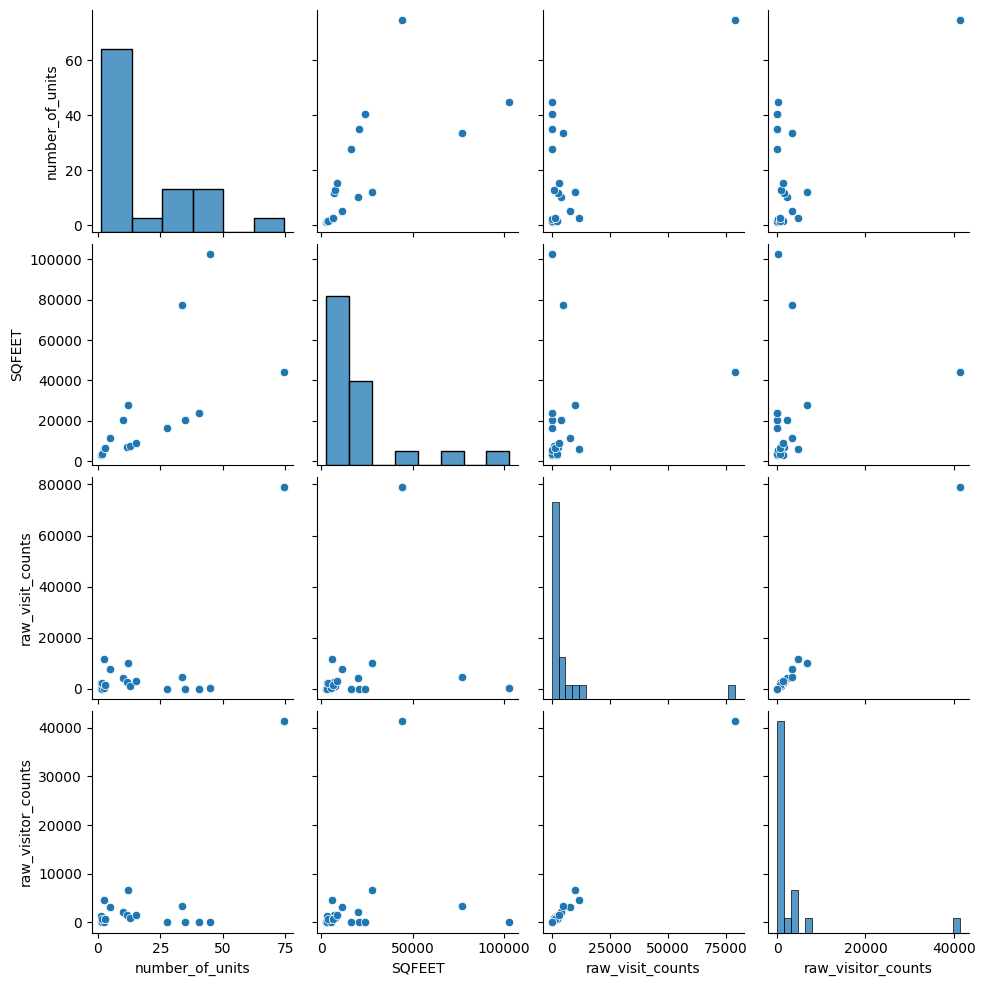

In [16]:
# Plot correlations
cols_to_analyze = [
    "number_of_units",
    "SQFEET",
    "raw_visit_counts",
    "raw_visitor_counts",
]
sns.pairplot(address_traffic_gdf[cols_to_analyze])
plt.show()

The pair plot provides a visual summary of the pairwise relationships and distributions of four key variables: `raw_visit_counts`, `raw_visitor_counts`, `number_of_units`, and `SQFEET`.

From the scatter plots, we can observe the following relationships between variables:

- `raw_visit_counts` and `raw_visitor_counts` seem to have a positive linear relationship, suggesting that places with more visits also tend to have more unique visitors.
- `number_of_units` does not show a clear relationship with either `raw_visit_counts` or `raw_visitor_counts`, indicating that the number of units in a building doesn't strongly affect the visit or visitor counts in a linear way.
- `SQFEET` shows some degree of positive association with `raw_visit_counts`, which might indicate that larger areas tend to have more visits.
- `SQFEET` does not show a clear linear relationship with `number_of_units`, suggesting that larger square footage doesn't necessarily mean a greater number of units. This could be due to the presence of buildings with large common areas or facilities.

The histograms along the diagonal provide insights into the distribution of individual variables:

- `raw_visit_counts` and `raw_visitor_counts` have skewed distributions with long tails to the right, indicating a few locations with exceptionally high visit or visitor counts.
- `number_of_units` is heavily concentrated at lower values with very few locations having a high number of units, which suggests most buildings in the dataset are smaller in unit count.
- `SQFEET` also has a right-skewed distribution with most buildings having lower square footage and a few much larger outliers.

Overall, the plot suggests that while there are some relationships between the size of a building and visitation patterns, the number of units is less clearly related to these factors, and there are indications of a few unusual data points that may require further investigation.


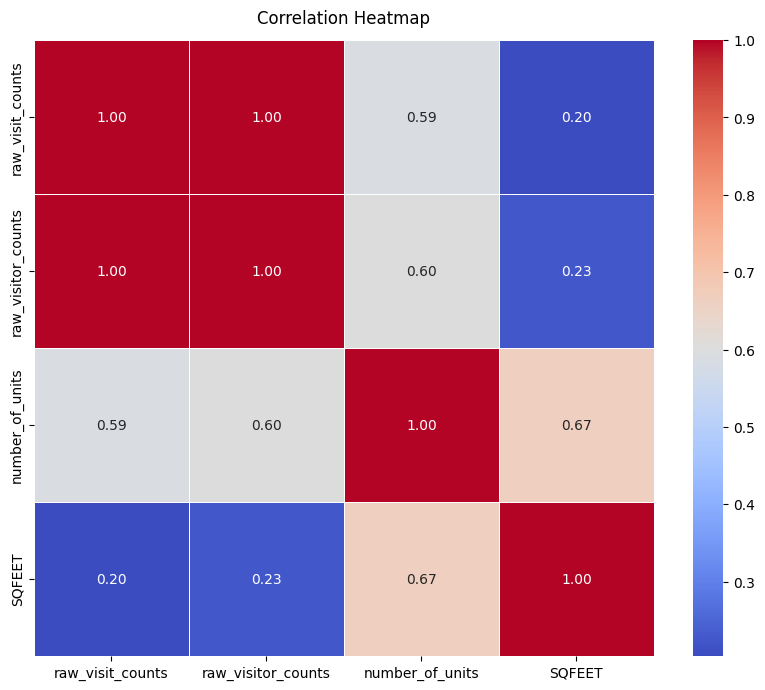

In [17]:
# Create a heatmap from the correlation matrix
cols_to_analyze2 = [
    "raw_visit_counts",
    "raw_visitor_counts",
    "number_of_units",
    "SQFEET",
]
correlation_matrix = address_traffic_gdf[cols_to_analyze2].corr()
plt.figure(figsize=(10, 8))  # Adjust the size of the figure as needed
heatmap = sns.heatmap(
    correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5
)
heatmap.set_title("Correlation Heatmap", fontdict={"fontsize": 12}, pad=12)
plt.show()

#### Conclusions

-
-
-
